In [1]:
import os
os.environ['WANDB_NOTEBOOK_NAME'] = 'OneClassImageNet.ipynb'
import wandb
wandb.login()

dataset_name = 'imagenette'

wandb: Currently logged in as: algue (use `wandb login --relogin` to force relogin)


### Algorithm

In [2]:
import pandas as pd
import sklearn.preprocessing as preprocessing
from sklearn.datasets import make_moons
from sklearn.datasets import make_circles
import tqdm
import numpy as np
from functools import partial
import tensorflow as tf

In [3]:
def compute_norm(vec):
    square_norm = tf.reduce_sum(vec ** 2., axis=tuple(range(1, len(vec.shape))), keepdims=True)
    return square_norm ** 0.5

def compute_angle(grad, prev_grad, grad_norm, prev_grad_norm):
    eps = 1e-5
    cos_theta = tf.reduce_sum(grad * prev_grad, axis=[1,2,3]) / tf.squeeze(grad_norm*prev_grad_norm + eps)
    theta     = tf.reduce_mean(tf.math.acos(cos_theta) / 3.14159 * 180)
    return theta

In [4]:
def uniform_sampler(gen, batch_size, input_shape):
    dim = np.prod(input_shape)
    seeds = gen.uniform(shape=(batch_size,) + input_shape, minval=config.domain[0], maxval=config.domain[1])
    if config.sample_corners:
        seeds = tf.math.sign(seeds)
    return seeds

In [5]:
def manifold_to_frontier(model, gen, seeds, maxiter, eta, margin, *, target=0., infos=False):
    step_size = eta / maxiter
    prev_grad = tf.ones_like(seeds)
    prev_grad_norm = compute_norm(prev_grad)
    stddev = 0.1 * margin / (np.prod(seeds.shape[1:])**0.5)
    noise = gen.normal(shape=seeds.shape, mean=0., stddev=stddev)
    seeds = seeds + noise
    if config.images_clip:
        seeds = tf.clip_by_value(seeds, config.domain[0], config.domain[1])
    for step in range(maxiter):
        with tf.GradientTape(watch_accessed_variables=False) as tape:
            tape.watch(seeds)
            y = model(seeds, training=True)
        if step == 0:
            y_seed = y
        grad  = tape.gradient(y, seeds)
        grad_norm = compute_norm(grad)
        theta = compute_angle(grad, prev_grad, grad_norm, prev_grad_norm)
        prev_grad, prev_grad_norm = grad, grad_norm
        if config.grad_norm == 'adaptive':
            grad  = grad / (grad_norm)**2
        elif config.grad_norm == 'normalize':
            grad  = grad / grad_norm
        else:
            raise ValueError(f"Unrecognized {config.grad_norm}")
        shape  = (len(seeds),)+(1,)*(len(seeds.shape)-1)
        y      = tf.reshape(y, shape)
        maxval = -tf.nn.relu(-(target - y))  # stop after crossing the frontier
        advs   = seeds + step_size * maxval * grad
        if config.images_clip:
            advs = tf.clip_by_value(advs, config.domain[0], config.domain[1])
        seeds = advs
    if infos:
        return advs, (float(tf.reduce_mean(grad_norm)), y_seed, theta)
    return advs

def ambient_to_frontier(model, gen, seeds, maxiter, eta, *, target=0., whole_support=True, infos=False):
    # Similar to greedy importance sampling with local search:
    #    https://arxiv.org/ftp/arxiv/papers/1301/1301.3890.pdf
    # Moreover P = Q = uniform
    # alpha_ij = 1/m for branching b=1 (no merging paths; straight lines only)
    # same weight: mean() is sufficient
    # Approximator of E_{uniform}[f(x)] with good improvement
    # WARNING: biased on continus measures
    step_size = eta / maxiter
    prev_grad = tf.ones_like(seeds)
    prev_grad_norm = compute_norm(prev_grad)
    for step in range(maxiter):
        with tf.GradientTape(watch_accessed_variables=False) as tape:
            tape.watch(seeds)
            y = model(seeds, training=True)
        if step == 0:
            y_seed = y
        grad  = tape.gradient(y, seeds)
        grad_norm = compute_norm(grad)
        theta = compute_angle(grad, prev_grad, grad_norm, prev_grad_norm)
        prev_grad, prev_grad_norm = grad, grad_norm
        if config.grad_norm == 'adaptive':
            grad  = grad / (grad_norm)**2
        elif config.grad_norm == 'normalize':
            grad  = grad / grad_norm
        else:
            raise ValueError(f"Unrecognized {config.grad_norm}")
        shape = (len(seeds),)+(1,)*(len(seeds.shape)-1)
        y     = tf.reshape(y, shape)
        maxval = tf.nn.relu(target - y)  # stop after crossing the frontier
        if config.deterministic:
            factor = 1.
        else:
            factor = gen.uniform(shape=shape, minval=tf.zeros_like(y), maxval=tf.ones_like(y))
        advs  = seeds + step_size * maxval * grad * factor
        if config.images_clip:
            advs = tf.clip_by_value(advs, config.domain[0], config.domain[1])
        seeds = advs
    if infos:
        return advs, (float(tf.reduce_mean(grad_norm)), y_seed, theta)
    return advs


def adversarial_sampler(model, gen, in_manifold, out_manifold, margin, *, infos=False):
    maxiter, eta,            = config.maxiter, config.eta
    advs_from_out, infos_out = ambient_to_frontier(model, gen, out_manifold, maxiter, eta, infos=infos)
    advs_from_in , infos_in  = manifold_to_frontier(model, gen, in_manifold, maxiter, eta, margin, infos=infos)
    return (advs_from_out, advs_from_in), (infos_out, infos_in)

In [6]:
def plot_metrics(pb, loss_fn, losses, infos):
    (y_advs_out, y_advs_in, y_in, y_seed_out, grad_norm_out, grad_norm_in, theta_out, theta_in) = infos
    recall = tf.reduce_mean(tf.cast(y_in > 0., dtype=tf.int32))
    false_positive = tf.reduce_mean(tf.cast(y_advs_out > 0., dtype=tf.int32))
    pb.set_postfix(R=f'{recall:.2f}%', FP=f'{false_positive:.2f}%',
                   loss=f'{float(np.array(losses).mean()):.3f}',
                   GN_out=f'{float(grad_norm_out):.3f}', GN_in=f'{float(grad_norm_in):.3f}',
                   y_out=f'{float(y_advs_out.numpy().mean()):.3f}', P=f'{float(y_in.numpy().mean()):.3f}',
                   seeds=f'{float(y_seed_out.numpy().mean()):.3f}', y_advs_in=f'{float(y_advs_in.numpy().mean()):.3f}',
                   O_out=f'{float(theta_out):.1f}°', O_in=f'{float(theta_in):.1f}°',
                   margin=f'{float(loss_fn.margin):.3f}')
    if plot_wandb:
        wandb.log({'R':recall, 'FP':false_positive, 'loss':losses[-1],
                   'margin':float(loss_fn.margin),
                   'GN_out':grad_norm_out, 'GN_in':grad_norm_in,
                   'O_out':theta_out, 'O_in':theta_in,
                   'y_out' :float(y_advs_out.numpy().mean()), 'P':float(y_in.numpy().mean()),
                   'seeds':float(y_seed_out.numpy().mean()), 'y_in' :float(y_advs_in.numpy().mean())})

In [7]:
@tf.function
def train_step(model, loss_fn, opt, gen, x_batch):
    half_batch = len(x_batch) // 2
    seeds = uniform_sampler(gen, half_batch, x_batch.shape[1:])
    (advs_out, advs_in), (infos_out, infos_in) = adversarial_sampler(model, gen, x_batch[:half_batch], seeds, loss_fn.margin, infos=True)
    weights = model.trainable_weights + [loss_fn.margin_weight]
    with tf.GradientTape() as tape:
        y_advs_out = model(advs_out, training=True)
        y_advs_in  = model(advs_in , training=True)
        y_in       = model(x_batch , training=True)
        is_pos     = tf.math.sign(tf.nn.relu(y_in[:y_advs_in.shape[0]]))
        loss_in      = tf.reduce_mean(loss_fn( y_in))
        loss_adv_out = tf.reduce_mean(loss_fn(-y_advs_out))
        loss_adv_in  = tf.reduce_mean(loss_fn(-y_advs_in) * is_pos)
        if config.manifold_out_only:
            loss = loss_in + loss_adv_out
        else:
            loss = loss_in + 0.5 *(loss_adv_out + loss_adv_in)
    grad = tape.gradient(loss, weights)
    grad_model, grad_margin = grad[:-1], grad[-1]
    opt.apply_gradients(zip(grad_model, weights))
    loss_fn.margin_opt.apply_gradients([(grad_margin, loss_fn.margin_weight)])
    if config.bjorck and config.pgd:
        model.condense()
    (grad_norm_out, y_seed_out, theta_out), (grad_norm_in, _, theta_in) = infos_out, infos_in
    return loss, (y_advs_out, y_advs_in, y_in, y_seed_out, grad_norm_out, grad_norm_in, theta_out, theta_in)

In [8]:
def train_loop(model, opt_cls, gen, loss_fn, dataset, epoch_length):
    opt = opt_cls  #opt_cls()
    with tqdm.tqdm(total=epoch_length) as pb:
        losses = []
        for step, x_batch in zip(range(epoch_length), dataset):
            loss, infos = train_step(model, loss_fn, opt, gen, x_batch)
            losses.append(loss.numpy())
            plot_metrics(pb, loss_fn, losses, infos)
            pb.update()

In [9]:
import math
import tensorflow as tf
import deel
from tensorflow.keras.layers import Flatten
from deel.lip.initializers import SpectralInitializer
from deel.lip.layers import SpectralDense, SpectralConv2D, LipschitzLayer, Condensable, InvertibleDownSampling
from deel.lip.layers import ScaledGlobalAveragePooling2D, FrobeniusDense, ScaledAveragePooling2D
from deel.lip.activations import MaxMin, GroupSort, GroupSort2, FullSort
from deel.lip.model import Sequential as DeelSequential
from deel.lip.activations import PReLUlip, FullSort
from lipschitz_normalizers import NormalizedDense, SpectralInfConv2D
from tensorflow.keras.layers import InputLayer, AveragePooling2D


def discriminator(input_shape, conv_widths, dense_widths, block_size, window_size, k_coef_lip=1.):
    # multivariate universal approximation holds
    layers = [InputLayer(input_shape)]
    activation = GroupSort2 if config.groupsort else FullSort
    window_size = window_size
    strides = (2, 2) if config.strides else (1, 1)
    if config.bjorck:
        for i, width in enumerate(conv_widths):
            for _ in range(block_size):
                if i == 0 and config.two_infinity_start:
                    layers.append(SpectralInfConv2D(widths[0], window_size, normalizer='2-inf', strides=strides, projection=config.pgd))
                else:
                    layers.append(SpectralConv2D(width, window_size, strides=strides))
                layers.append(activation())
            if not config.strides:
                layers.append(ScaledAveragePooling2D((2, 2)))
        if config.pooling:
            layers.append(ScaledGlobalAveragePooling2D())
        else:
            layers.append(Flatten())
        for width in dense_widths:
            layers.append(SpectralDense(width))
            layers.append(activation())
        layers.append(NormalizedDense(1, normalizer='2-inf', projection=config.pgd))
    else:
        for i, width in enumerate(conv_widths):
            normalizer = '2-inf' if i == 0 else 'inf'
            layers.append(SpectralInfConv2D(width, window_size, normalizer=normalizer, strides=strides, projection=config.pgd))
            layers.append(activation())
            if not config.strides:
                layers.append(AveragePooling2D((2, 2), padding='valid'))
        layers.append(Flatten())
        for width in dense_widths:
            layers.append(NormalizedDense(width, normalizer='inf', projection=config.pgd))
            layers.append(activation())
        layers.append(NormalizedDense(1, normalizer='inf', projection=config.pgd))
    model = DeelSequential(layers, k_coef_lip=k_coef_lip)
    return model

## Data

* https://github.com/deepmind/dm-haiku/blob/main/examples/imagenet/dataset.py
* https://github.com/google/flax/blob/main/examples/imagenet/input_pipeline.py
* https://github.com/ischlag/tensorflow-input-pipelines/blob/master/datasets/imagenet.py
* https://timm.fast.ai/random_resized_crop

In [10]:
import tensorflow_datasets as tfds
from typing import Iterable, Iterator, Mapping, Optional, Sequence, Tuple

IMAGE_SIZE = 64 # 112  # 224
NUM_OF_CHANNELS = 3
CROP_PADDING = 32
MEAN_RGB = [0.485 * 255, 0.456 * 255, 0.406 * 255]
STDDEV_RGB = [0.229 * 255, 0.224 * 255, 0.225 * 255]
NUM_IMAGES = 9469

def _center_crop(
    image: tf.Tensor,
    original_shape: Optional[tf.Tensor] = None,
) -> tf.Tensor:
    """Crops to center of image with padding then scales."""
    if original_shape is None:
        original_shape = tf.shape(image)
    image_height = original_shape[0]
    image_width = original_shape[1]

    padded_center_crop_size = tf.cast(
      ((IMAGE_SIZE / (IMAGE_SIZE + CROP_PADDING)) *
       tf.cast(tf.minimum(image_height, image_width), tf.float32)), tf.int32)

    offset_height = ((image_height - padded_center_crop_size) + 1) // 2
    offset_width = ((image_width - padded_center_crop_size) + 1) // 2
    crop_window = tf.stack([offset_height, offset_width,
                          padded_center_crop_size, padded_center_crop_size])
    image = tf.image.crop_to_bounding_box(image, offset_height, offset_width, padded_center_crop_size, padded_center_crop_size)
    return image

def _distorted_bounding_box_crop(
    image: tf.Tensor,
    *,
    jpeg_shape: tf.Tensor,
    bbox: tf.Tensor,
    min_object_covered: float,
    aspect_ratio_range: Tuple[float, float],
    area_range: Tuple[float, float],
    max_attempts: int,
) -> tf.Tensor:
    """Generates cropped_image using one of the bboxes randomly distorted."""
    bbox_begin, bbox_size, _ = tf.image.sample_distorted_bounding_box(
      jpeg_shape,
      bounding_boxes=bbox,
      min_object_covered=min_object_covered,
      aspect_ratio_range=aspect_ratio_range,
      area_range=area_range,
      max_attempts=max_attempts,
      use_image_if_no_bounding_boxes=True)

    # Crop the image to the specified bounding box.
    offset_y, offset_x, _ = tf.unstack(bbox_begin)
    target_height, target_width, _ = tf.unstack(bbox_size)
    image = tf.image.crop_to_bounding_box(image, offset_y, offset_x, target_height, target_width)
    return image

def random_crop(image, image_size):
    """Make a random crop of image_size."""
    original_shape = tf.shape(image)
    bbox = tf.constant([0.0, 0.0, 1.0, 1.0], dtype=tf.float32, shape=[1, 1, 4])
    image = _distorted_bounding_box_crop(
      image,
      jpeg_shape=original_shape,
      bbox=bbox,
      min_object_covered=0.1,
      aspect_ratio_range=(3 / 4, 4 / 3),
      area_range=(0.08, 1.0),
      max_attempts=10)
    if tf.reduce_all(tf.equal(original_shape, tf.shape(image))):
        # If the random crop failed fall back to center crop.
        image = _center_crop(image, original_shape)
    return image

def _normalize_image(image: tf.Tensor) -> tf.Tensor:
    """Normalize the image to zero mean and unit variance."""
    image -= tf.constant(MEAN_RGB, shape=[1, 1, 3], dtype=image.dtype)
    image /= tf.constant(STDDEV_RGB, shape=[1, 1, 3], dtype=image.dtype)
    return image

def preprocess(image, label, augmentation):
    if augmentation:
        image = random_crop(image, IMAGE_SIZE)
        image = tf.image.random_flip_left_right(image)
    else:
        image = _center_crop(image)
    image = tf.image.resize(image, [IMAGE_SIZE, IMAGE_SIZE], tf.image.ResizeMethod.BICUBIC)
    image = _normalize_image(image)
    return image

def filter_labels(white_list):
    white_list = tf.constant(white_list, dtype=tf.int64)
    def filter_fun(image, label):
        return tf.math.reduce_any(tf.equal(label, white_list))
    return filter_fun

def build_dataset(batch_size, split='train'):
    is_train = split == 'train'
    ds = tfds.load('imagenette', split='validation' if split == 'ood' else split,
                   as_supervised=True,
                   shuffle_files=True)
    if split in ['train', 'validation'] :
        label_set = config.in_labels
    elif split == 'ood':
        label_set = list(set(range(0, 10)).difference(config.in_labels))
    ds = ds.filter(filter_labels(label_set))
    ds = ds.map(lambda *t: preprocess(*t, augmentation=is_train))
    to_shuffle = 2
    ds = ds.repeat().shuffle(to_shuffle*batch_size)  # always repeat a dataset
    ds = ds.batch(batch_size).prefetch(4)
    return ds

## Plot

In [11]:
from plotly.subplots import make_subplots
import plotly.graph_objects as go

def plot_imgs(batch, filename, save_file=False, num_rows=2, num_cols=8):
    """Plot images on a grid."""
    to_plot = num_rows * num_cols
    fig = make_subplots(rows=num_rows, cols=num_cols, x_title=filename.split(".")[0])
    images = batch[:to_plot]
    for i, img in enumerate(images):
        row = i // num_cols + 1
        col = i %  num_cols + 1
        img = img * STDDEV_RGB + MEAN_RGB
        trace = go.Image(z=img, zmax=(255,255,255,255), zmin=(0, 0, 0, 0), colormodel="rgb")
        fig.add_trace(trace, row=row, col=col)
    if save_file:
        fig.write_image(filename)
    if plot_wandb:
        wandb.save(filename)
    return fig

In [12]:
def plot_advs(epoch, x_batch, margin, eta_gan=1.5, maxiter_gan=64, save_file=False, plot_in=False):
    """Plot GAN examples, out-of-maniold adversaries, and in-manifold adversaries."""
    seeds = uniform_sampler(gen, len(x_batch), x_batch.shape[1:])
    (advs_out, advs_in), _ = adversarial_sampler(model, gen, x_batch, seeds, margin, infos=True)
    adv_gan = ambient_to_frontier(model, gen, seeds, maxiter=maxiter_gan, eta=config.eta*eta_gan,
                                  target=2*margin, infos=False)
    y_advs_out = model(advs_out, training=True)
    y_advs_in  = model(advs_in , training=True)
    y_advs_gan  = model(adv_gan , training=True)
    print(f"Generated y_advs_out={y_advs_out.numpy().mean()}  y_advs_in={y_advs_in.numpy().mean()} y_adv_gan={y_advs_gan.numpy().mean()}")
    print_freq = 10
    must_save = (epoch%print_freq == 0)
    fig = plot_imgs(advs_out, f'{dataset_name}_advs_out_{epoch}.png', save_file=must_save)
    if epoch%print_freq == 0:
        fig.show()
    fig = plot_imgs(advs_in,  f'{dataset_name}_advs_in_{epoch}.png', save_file=must_save)
    if plot_in or epoch+1>=config.num_epochs:
        fig.show()
    fig = plot_imgs(advs_in - x_batch,  f'{dataset_name}_advs_delta.png', save_file=save_file)
    if plot_in or epoch+1>=config.num_epochs:
        fig.show()
    fig = plot_imgs(adv_gan,  f'{dataset_name}_gan_{epoch}.png', save_file=must_save)
    if epoch%print_freq == 0:
        fig.show()

In [13]:
from scipy import stats
import pandas as pd
import plotly.express as px
from sklearn.metrics import roc_auc_score

def calibrate(y_pos, y_neg):
    """Calibrate threshold for optimal prediction."""
    y = np.concatenate([y_neg, y_pos], axis=0)
    labels = np.concatenate([np.zeros_like(y_neg), np.ones_like(y_pos)])
    roc_auc = roc_auc_score(labels, y)
    indices = np.argsort(y)
    sorted_labels = labels[indices]
    y_sorted = y[indices]
    forward = np.cumsum(1-sorted_labels)
    backward = np.cumsum(sorted_labels[::-1]) - sorted_labels[-1]
    scores = forward + backward[::-1]
    idx_max = np.argmax(scores)
    return y_sorted[idx_max], (scores[idx_max] / len(scores)) * 100, roc_auc

def plot_preds_ood(model, epoch, X_train, X_test, X_ood, loss_fn, save_file=True, plot_ood=False, extra_infos=True):
    """Plot histogram and Two Sample test statistics."""
    y_train    = model(tf.constant(X_train), training=True).numpy().flatten()
    y_test     = model(tf.constant(X_test), training=True).numpy().flatten()
    y_ood      = model(tf.constant(X_ood), training=True).numpy().flatten()
    r_train    = stats.describe(y_train, axis=None)
    r_test     = stats.describe(y_test, axis=None)
    r_ood      = stats.describe(y_ood, axis=None)
    print(f"Train examples {r_train}")
    print(f"Test examples {r_test}")
    print(f"OOD examples {r_ood}")
    T_train, acc_train, roc_auc_train = calibrate(y_train, y_ood)
    T_test, acc_test, roc_auc_test = calibrate(y_test, y_ood)
    print(f"[train/ood] Avg Dist={r_train.mean-r_ood.mean} T={T_train} Acc={acc_train}%")
    print(f"[train/ood] ROC-AUC ={roc_auc_train}")
    print(f"[test /ood] Avg Dist ={r_test.mean-r_ood.mean} T={T_test} Acc={acc_test}%")
    print(f"[test /ood] ROC-AUC ={roc_auc_test}")
    df = pd.DataFrame({'distribution' : ['train'] * len(y_train) + ['test'] * len(y_test) + ['ood'] * len(y_ood),
                       'score'        : np.concatenate([y_train, y_test, y_ood], axis=0)})
    fig = px.histogram(df, x="score", color="distribution", hover_data=df.columns, 
                       histnorm='density', marginal="rug",  # can be `box`, `violin`
                       opacity=0.75)
    fig.add_shape(type="line", x0=T_test, y0=0, x1=T_test, y1=max(len(y_test), len(y_ood)),
                  line=dict(color="black", width=2))
    fig.add_shape(type="line", x0=T_train, y0=0, x1=T_train, y1=max(len(y_train), len(y_ood)),
                  line=dict(color="orange", width=2, dash='dash'))
    print_freq = 10
    if epoch%print_freq == 0:
        fig.show()
    if plot_wandb:
        wandb.log({'roc_auc_train': roc_auc_train, 'T_acc_train': acc_train})
        wandb.log({'roc_auc_test' : roc_auc_test, 'T_acc_test': acc_test})
        if save_file and epoch%print_freq == 0:
            filename = f"ood_histogram_{epoch}.png"
            fig.write_image(filename)
            wandb.save(filename)
    if plot_ood:
        return plot_imgs(X_ood, f"mnist_ood.png")

def evaluate(model, epoch, it_dataset, it_test, it_ood):
    train_batch = next(it_dataset)
    test_batch = next(it_test)
    ood_batch = next(it_ood)
    return plot_preds_ood(model, epoch, train_batch, test_batch, ood_batch, sh_kr, extra_infos=False)

## Train model

In [14]:
from types import SimpleNamespace
import math

domain = [-255 / min(STDDEV_RGB), 255 / min(STDDEV_RGB)]
img_size = IMAGE_SIZE
num_channels = NUM_OF_CHANNELS

def perc_to_margin(perc):
    return perc * (img_size * img_size * num_channels * (domain[1] - domain[0]))**0.5

# heuristic of https://arxiv.org/abs/2206.06854
ratio_pixels = 5 / 100
margin = perc_to_margin(ratio_pixels)  # 5% pixels for real images
lbda = 1. / ratio_pixels  

debug = False
if debug:
    conv_widths = [20, 20, 20]
    dense_widths = [20, 20]
    block_size = 1
    window_size = (5, 5)
else:
    conv_widths = [128, 128, 128, 128, 128]
    dense_widths = [128, 128]
    block_size = 2
    window_size = (3, 3)

config = SimpleNamespace(
    dataset_name = f"{dataset_name}",
    optimizer = "adam",
    maxiter = 16,
    eta = 10.,
    batch_size = 80,
    domain = domain,
    margin = margin,
    lbda = lbda,
    margin_low = perc_to_margin(0.01 * ratio_pixels),
    margin_high = perc_to_margin(10 * ratio_pixels),
    ratio_pixels = ratio_pixels,
    k_coef_lip = 1.,
    strides = False,
    num_epochs = 1 if debug else (200+1),
    bjorck = True,
    pgd = False,
    images_clip = True,
    deterministic = True,
    grad_norm = 'adaptive',
    pooling = True,
    groupsort = True,
    sample_corners = False,
    manifold_out_only = False,
    two_infinity_start = False,
    conv_widths = conv_widths,  # [5*5*1=25 , 5*5*25=625]
    dense_widths = dense_widths,
    block_size = block_size,
    window_size = window_size,
    in_labels = [5]
)
plot_wandb = not debug
if plot_wandb:
    wandb.init(project="oneclass_images", config=config.__dict__, group=f"imagenette_sandbox_{config.in_labels[0]}", save_code=True)
print(config)

wandb: wandb version 0.12.20 is available!  To upgrade, please run:
wandb:  $ pip install wandb --upgrade


namespace(batch_size=80, bjorck=True, block_size=2, conv_widths=[128, 128, 128, 128, 128], dataset_name='imagenette', dense_widths=[128, 128], deterministic=True, domain=[-4.4642857142857135, 4.4642857142857135], eta=10.0, grad_norm='adaptive', groupsort=True, images_clip=True, in_labels=[5], k_coef_lip=1.0, lbda=20.0, manifold_out_only=False, margin=16.5615734242165, margin_high=165.615734242165, margin_low=0.165615734242165, maxiter=16, num_epochs=201, optimizer='adam', pgd=False, pooling=True, ratio_pixels=0.05, sample_corners=False, strides=False, two_infinity_start=False, window_size=(3, 3))


In [15]:
input_shape = (IMAGE_SIZE, IMAGE_SIZE, NUM_OF_CHANNELS)
model = discriminator(input_shape, conv_widths=config.conv_widths,
                      dense_widths=config.dense_widths,
                      block_size=config.block_size,
                      window_size=config.window_size,
                      k_coef_lip=config.k_coef_lip)

In [16]:
class SH_KR:
    def __init__(self, ratio_pixels, margin, lbda, margin_low, margin_high):
        self.ratio_pixels = ratio_pixels
        self.margin_low = margin_low
        self.margin_high = margin_high
        constraint = lambda m: tf.clip_by_value(m, self.margin_low, self.margin_high)
        self.margin_weight = tf.Variable(
            initial_value=margin,
            trainable=True,
            constraint=constraint,
            dtype=tf.float32)
        self.lbda = lbda
        self.margin_opt = tf.keras.optimizers.Adam(learning_rate=1e-3)
    @property
    def margin(self):
        return self.margin_weight.value()
    def __call__(self, y):
        regul = self.ratio_pixels * self.margin
        hinge_part = self.lbda * (tf.nn.relu(self.margin - y) - regul)
        wasserstein_part = tf.reduce_mean(-y)
        return hinge_part + wasserstein_part
    
sh_kr = SH_KR(config.ratio_pixels, config.margin, config.lbda, config.margin_low, config.margin_high)

In [17]:
dataset = build_dataset(config.batch_size)
epoch_length = math.ceil(NUM_IMAGES / config.batch_size)
if config.optimizer == 'adam':
    opt = tf.keras.optimizers.Adam
elif config.optimizer == 'rmsprop':
    opt = tf.keras.optimizers.RMSprop
elif config.optimizer == 'amsgrad':
    opt = partial(tf.keras.optimizers.Adam, amsgrad=True)
opt = opt()
gen = tf.random.Generator.from_seed(9481)
free_batch = next(iter(dataset))
print(free_batch.shape)
_ = model(free_batch, training=True)  # garbage forward
seeds = uniform_sampler(gen, config.batch_size, free_batch.shape[1:])
model.summary()

(80, 64, 64, 3)
Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
spectral_conv2d (SpectralCon (None, 64, 64, 128)       7169      
_________________________________________________________________
group_sort2 (GroupSort2)     (None, 64, 64, 128)       0         
_________________________________________________________________
spectral_conv2d_1 (SpectralC (None, 64, 64, 128)       295169    
_________________________________________________________________
group_sort2_1 (GroupSort2)   (None, 64, 64, 128)       0         
_________________________________________________________________
scaled_average_pooling2d (Sc (None, 32, 32, 128)       0         
_________________________________________________________________
spectral_conv2d_2 (SpectralC (None, 32, 32, 128)       295169    
_________________________________________________________________
group_sort2_2 (GroupSort2)   (None, 32, 

In [18]:
it_dataset = iter(dataset)
it_test = iter(build_dataset(config.batch_size, split='validation'))
it_ood = iter(build_dataset(config.batch_size, split='ood'))

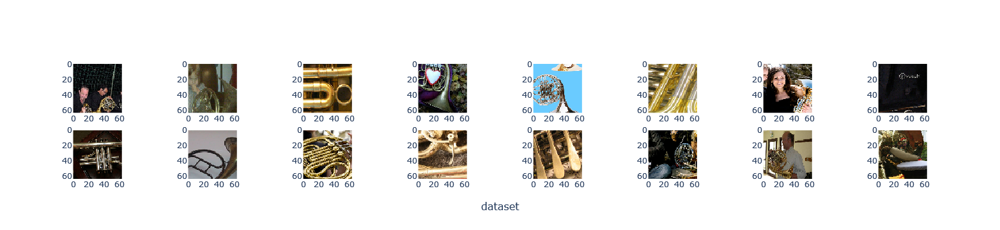

In [19]:
plot_imgs(next(it_dataset), 'dataset.png', save_file=True, num_rows=2, num_cols=8)

S=0.3368421494960785 2-inf=[('0.11260650306940079', '0.2163139283657074')] inf=[('0.46463003754615784', '0.878345251083374')] 2=[(0.33684206, 0.33684215)]
S=0.3368423581123352 2-inf=[('0.3368420898914337', '0.3368421494960785')] inf=[('8.923419952392578', '9.311805725097656')] 2=[(0.3368419, 0.33684236)]
S=0.34042567014694214 2-inf=[('0.3404254615306854', '0.3404255211353302')] inf=[('9.036768913269043', '9.452523231506348')] 2=[(0.3404251, 0.34042567)]
S=0.3404256999492645 2-inf=[('0.3404254913330078', '0.3404255211353302')] inf=[('9.045828819274902', '9.432422637939453')] 2=[(0.3404251, 0.3404257)]
S=0.3478262722492218 2-inf=[('0.3478260636329651', '0.34782612323760986')] inf=[('9.213644027709961', '9.593645095825195')] 2=[(0.34782577, 0.34782627)]
S=0.34782639145851135 2-inf=[('0.3478260636329651', '0.34782612323760986')] inf=[('9.213895797729492', '9.592182159423828')] 2=[(0.34782586, 0.3478264)]
S=0.36363673210144043 2-inf=[('0.3636363446712494', '0.3636363744735718')] inf=[('9.67

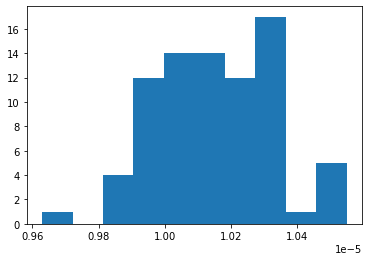

In [20]:
from utils import check_grads
check_grads(model, seeds, plot_wandb=plot_wandb)

In [21]:
num_epochs = config.num_epochs
for epoch in range(num_epochs):
    train_loop(model, opt, gen, sh_kr, dataset, epoch_length)
    check_grads(model, seeds, plot_wandb=plot_wandb)
    evaluate(model, epoch, it_dataset, it_test, it_ood)
    plot_advs(epoch, next(it_dataset), sh_kr.margin, save_file=True)

  0%|          | 0/119 [00:49<?, ?it/s]


ValueError: in user code:

    <ipython-input-7-bf402bc0c4e0>:14 train_step  *
        loss_adv_in  = tf.reduce_mean(loss_fn(-y_advs_in) * is_pos)
    /home/lbethune/anaconda3/envs/tf2/lib/python3.8/site-packages/tensorflow/python/ops/math_ops.py:1180 binary_op_wrapper
        raise e
    /home/lbethune/anaconda3/envs/tf2/lib/python3.8/site-packages/tensorflow/python/ops/math_ops.py:1164 binary_op_wrapper
        return func(x, y, name=name)
    /home/lbethune/anaconda3/envs/tf2/lib/python3.8/site-packages/tensorflow/python/ops/math_ops.py:1496 _mul_dispatch
        return multiply(x, y, name=name)
    /home/lbethune/anaconda3/envs/tf2/lib/python3.8/site-packages/tensorflow/python/util/dispatch.py:201 wrapper
        return target(*args, **kwargs)
    /home/lbethune/anaconda3/envs/tf2/lib/python3.8/site-packages/tensorflow/python/ops/math_ops.py:518 multiply
        return gen_math_ops.mul(x, y, name)
    /home/lbethune/anaconda3/envs/tf2/lib/python3.8/site-packages/tensorflow/python/ops/gen_math_ops.py:6077 mul
        _, _, _op, _outputs = _op_def_library._apply_op_helper(
    /home/lbethune/anaconda3/envs/tf2/lib/python3.8/site-packages/tensorflow/python/framework/op_def_library.py:748 _apply_op_helper
        op = g._create_op_internal(op_type_name, inputs, dtypes=None,
    /home/lbethune/anaconda3/envs/tf2/lib/python3.8/site-packages/tensorflow/python/framework/func_graph.py:590 _create_op_internal
        return super(FuncGraph, self)._create_op_internal(  # pylint: disable=protected-access
    /home/lbethune/anaconda3/envs/tf2/lib/python3.8/site-packages/tensorflow/python/framework/ops.py:3528 _create_op_internal
        ret = Operation(
    /home/lbethune/anaconda3/envs/tf2/lib/python3.8/site-packages/tensorflow/python/framework/ops.py:2015 __init__
        self._c_op = _create_c_op(self._graph, node_def, inputs,
    /home/lbethune/anaconda3/envs/tf2/lib/python3.8/site-packages/tensorflow/python/framework/ops.py:1856 _create_c_op
        raise ValueError(str(e))

    ValueError: Dimensions must be equal, but are 40 and 80 for '{{node mul_183}} = Mul[T=DT_FLOAT](add_67, Sign)' with input shapes: [40,1], [80,1].


In [ ]:
check_grads(model, seeds, plot_wandb=plot_wandb)
evaluate(model, epoch, it_dataset, it_test, it_ood)
plot_advs(epoch, next(it_dataset), sh_kr.margin, save_file=True)    

In [ ]:
check_grads(model, seeds, plot_wandb=plot_wandb)

In [ ]:
evaluate(model, 100, it_dataset, it_test, it_ood)

In [ ]:
plot_advs(epoch, next(it_dataset), sh_kr.margin, save_file=False)

In [ ]:
if plot_wandb:
    wandb.finish()
    plot_wandb = False

In [ ]:
x_batch = next(it_dataset)
seeds = uniform_sampler(gen, len(x_batch), x_batch.shape[1:])
eta = 15.
maxiter = 64
step_size = eta / maxiter
target = 2. * config.margin
prev_grad = tf.ones_like(seeds)
prev_grad_norm = compute_norm(prev_grad)
for step in range(maxiter):
    with tf.GradientTape(watch_accessed_variables=False) as tape:
        tape.watch(seeds)
        y = model(seeds, training=True)
    if step == 0:
        y_seed = y
    grad  = tape.gradient(y, seeds)
    grad_norm = compute_norm(grad)
    theta = compute_angle(grad, prev_grad, grad_norm, prev_grad_norm)
    prev_grad, prev_grad_norm = grad, grad_norm
    if config.grad_norm == 'adaptive':
        grad  = grad / (grad_norm)**2
    elif config.grad_norm == 'normalize':
        grad  = grad / grad_norm
    else:
        raise ValueError(f"Unrecognized {config.grad_norm}")
    shape = (len(seeds),)+(1,)*(len(seeds.shape)-1)
    y     = tf.reshape(y, shape)
    print(step, tf.reduce_mean(y).numpy())
    maxval = tf.nn.relu(target - y)  # stop after crossing the frontier
    if config.deterministic:
        factor = 1.
    else:
        factor = gen.uniform(shape=shape, minval=tf.zeros_like(y), maxval=tf.ones_like(y))
    advs  = seeds + step_size * maxval * grad * factor
    if config.images_clip:
        advs = tf.clip_by_value(advs, config.domain[0], config.domain[1])
    seeds = advs
fig = plot_imgs(advs,  'mnist_gan.png', save_file=False)
fig.show()